# TRABAJO PRÁCTICO INTEGRADOR N°1

## Sistema de Análisis de Documentos Digitalizados

---

**Información del Estudiante:**
- **Nombre y Apellido:** Alejandro Schiariti
- **Fecha de Entrega:** 24 de Septiembre de 2025
- **Materia:** Procesamiento de Imágenes - IFTS24

---

### Objetivo

Desarrollar un sistema básico de análisis automático de documentos digitalizados que integre las técnicas de procesamiento de imágenes estudiadas en el curso.

### Estructura del Trabajo

| Parte | Descripción | Peso |
|-------|-------------|------|
| **1** | Fundamentos Teóricos | 20% |
| **2** | Setup del Entorno | 15% |
| **3** | Análisis de Imágenes | 35% |
| **4** | Preprocessing Básico | 30% |

**Dataset requerido:** 3 imágenes de documentos con diferentes características (buena calidad, rotada, con problemas de iluminación)

---

# PARTE 1: Fundamentos Teóricos

## ¿Por qué Cuadernos Interactivos para IA y Ciencias de Datos?

### Diferencias Metodológicas Fundamentales

El trabajo en inteligencia artificial y ciencias de datos requiere un enfoque metodológico diferente al desarrollo de software tradicional. Mientras que la programación tradicional sigue un flujo lineal y predecible, el trabajo con datos es inherentemente iterativo y exploratorio.

**Programación Tradicional:**
```
Requisitos → Diseño → Implementación → Testing → Producto
```

**Investigación en IA/Datos:**
```
Hipótesis ⟷ Experimento ⟷ Análisis ⟷ Refinamiento ⟷ Nueva Hipótesis
```

### Ventajas de los Cuadernos Interactivos

1. **Narrativa Científica:** Permiten documentar el proceso de pensamiento, no solo el resultado final
2. **Iteración Rápida:** Ejecutar y modificar secciones específicas sin reejecutar todo el programa
3. **Visualización Inmediata:** Ver resultados inmediatamente después de cada paso
4. **Comunicación Efectiva:** Stakeholders no técnicos pueden seguir el proceso y entender decisiones
5. **Reproducibilidad:** Otros investigadores pueden replicar exactamente los experimentos

### Casos de Uso en la Industria

- **Google Research:** Publica papers con cuadernos que permiten reproducir experimentos
- **Netflix:** Usa cuadernos para análisis de datos de usuarios y recomendaciones
- **Uber:** Análisis de patrones de viajes y optimización de rutas
- **Kaggle:** Plataforma completa basada en cuadernos para competencias de machine learning

### Cuándo Usar Cada Herramienta

**Usar Cuadernos para:**
- Análisis exploratorio de datos
- Experimentación y prototipado
- Comunicación de resultados
- Educación y documentación

**Usar Scripts para:**
- Sistemas en producción
- Automatización de tareas repetitivas
- APIs y servicios web
- Pipelines de datos automatizados

En este trabajo práctico, usaremos cuadernos porque estamos en la fase de investigación y experimentación, donde necesitamos entender los datos, probar diferentes enfoques y documentar nuestros hallazgos.

---

# PARTE 2: Setup del Entorno

En esta sección vas a configurar tu entorno de trabajo de manera profesional. Un setup bien hecho te ahorra tiempo y errores durante todo el proyecto.

**Material de consulta:** `Utilidades_y_Plantillas.ipynb`

## 2.1 Importaciones Básicas

Importá las librerías necesarias para procesamiento de imágenes y visualización:

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2  # OpenCV
from ipywidgets import interact, IntSlider

# Configuración básica de matplotlib para mostrar imágenes en línea
plt.rcParams["figure.figsize"] = (8, 6)
plt.rcParams["image.cmap"] = "gray"

print("Librerías importadas correctamente.")


Librerías importadas correctamente.


## 2.2 Funciones Utilitarias

Implementá una función básica para cargar y mostrar información de imágenes:

In [2]:
def cargar_imagen(ruta):
    """
    Carga una imagen desde la ruta dada y la convierte a formato RGB.
    Devuelve None si ocurre un error.
    """
    try:
        img = cv2.imread(ruta)  # OpenCV carga en BGR por defecto
        if img is None:
            print(f"[ERROR] No se pudo cargar la imagen desde: {ruta}")
            return None
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        return img_rgb
    except Exception as e:
        print(f"[ERROR] {e}")
        return None


def mostrar_info_imagen(imagen, titulo="Imagen"):
    """
    Muestra información básica de la imagen: dimensiones, tipo, rango de valores.
    """
    if imagen is None:
        print("[INFO] No hay imagen para mostrar información.")
        return

    print(f"--- {titulo} ---")
    print(f"Dimensiones: {imagen.shape}")  # (alto, ancho, canales)
    print(f"Tipo de dato: {imagen.dtype}")
    print(f"Rango de valores: {imagen.min()} a {imagen.max()}")

    # Mostrar la imagen
    plt.imshow(imagen)
    plt.title(titulo)
    plt.axis("off")
    plt.show()


In [3]:
def mostrar_umbral_interactivo(imagen_gray):
    """
    Muestra interactivamente el efecto de cambiar el umbral sobre una imagen en escala de grises.

    Args:
        imagen_gray (numpy.ndarray): Imagen en escala de grises a segmentar.
    """
    def actualizar_umbral(t):
        # Crear máscara binaria con el umbral actual
        _, mascara = cv2.threshold(imagen_gray, t, 255, cv2.THRESH_BINARY)

        # Crear figura con histograma y máscara
        plt.figure(figsize=(12,5))

        # Histograma
        plt.subplot(1,2,1)
        plt.hist(imagen_gray.ravel(), bins=256, color='gray')
        plt.axvline(t, color='red', linestyle='--', label=f'Umbral = {t}')
        plt.title('Histograma de Intensidades')
        plt.xlabel('Intensidad')
        plt.ylabel('Cantidad de píxeles')
        plt.legend()

        # Imagen binaria
        plt.subplot(1,2,2)
        plt.imshow(mascara, cmap='gray')
        plt.title('Máscara Binaria')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    # Slider interactivo: rango 0-255
    interact(actualizar_umbral, t=IntSlider(min=0, max=255, step=1, value=121))

In [4]:
def apply_clahe(image):
    """
    Aplica CLAHE (Adaptive Histogram Equalization) para mejorar el contraste local
    y regresa la imagen en formato RGB para su correcta visualización con Matplotlib.

    Args:
        image (np.array): La imagen de entrada en formato NumPy.
                          Puede ser BGR (color) o de un solo canal (escala de grises).

    Returns:
        np.array: La imagen con el contraste mejorado, en formato RGB.
    """
    # Si la imagen no está en color (es decir, es en escala de grises),
    # la convertimos a BGR para poder aplicar el CLAHE en el espacio de color LAB
    if len(image.shape) == 2:
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

    # Convierte la imagen de BGR a un espacio de color más apropiado (LAB)
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)

    # Creamos un objeto CLAHE
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))

    # Aplicamos CLAHE al canal de luminosidad (L)
    cl = clahe.apply(l)

    # Combinamos el canal de luminosidad mejorado con los canales A y B originales
    limg = cv2.merge((cl, a, b))

    # Convertimos la imagen de vuelta a BGR
    final_bgr = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

    # Y finalmente, convertimos el resultado de BGR a RGB
    final_rgb = cv2.cvtColor(final_bgr, cv2.COLOR_BGR2RGB)

    return final_rgb

## 2.3 Verificación del Setup

Probá que todo funciona creando una imagen sintética simple:

--- Imagen Sintética - Gradiente ---
Dimensiones: (100, 256, 3)
Tipo de dato: uint8
Rango de valores: 0 a 255


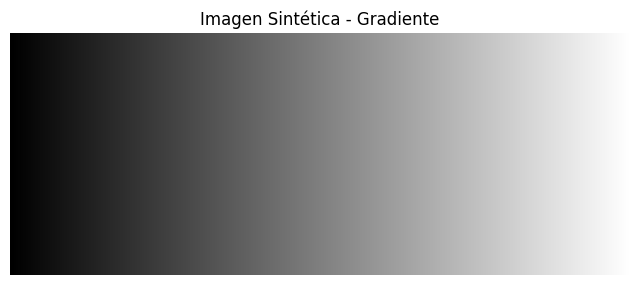

In [5]:
# Crear una imagen sintética simple (gradiente horizontal de 0 a 255)
ancho, alto = 256, 100
gradiente = np.tile(np.arange(ancho, dtype=np.uint8), (alto, 1))

# Convertir a RGB para usar nuestras funciones
gradiente_rgb = cv2.cvtColor(gradiente, cv2.COLOR_GRAY2RGB)

# Probar la función mostrar_info_imagen
mostrar_info_imagen(gradiente_rgb, titulo="Imagen Sintética - Gradiente")

---

# PARTE 3: Análisis de Tu Dataset

Ahora vas a trabajar con tu dataset de 3 documentos. Esta parte es clave para entender qué problemas tenés que resolver.

**Preparación del Dataset:**
- Creá una carpeta llamada `dataset/` en la misma ubicación que este notebook
- Incluí exactamente 3 imágenes de documentos:
  1. Una de buena calidad (bien iluminada, recta)
  2. Una rotada o inclinada
  3. Una con problemas (oscura, borrosa, o con sombras)

## 3.1 Carga de las Imágenes

**Material de consulta:** `002/TEO/LeerImagenColor.ipynb`

In [6]:
from google.colab import drive
drive.mount('/content/drive')

# Ruta base a tu dataset en Google Drive
ruta_base = "/content/drive/MyDrive/Colab Notebooks/Tecnicas de Procesamiento de Imagenes/TP Integrador/dataset/"

Mounted at /content/drive


--- Buena Calidad ---
Dimensiones: (282, 423, 3)
Tipo de dato: uint8
Rango de valores: 0 a 255


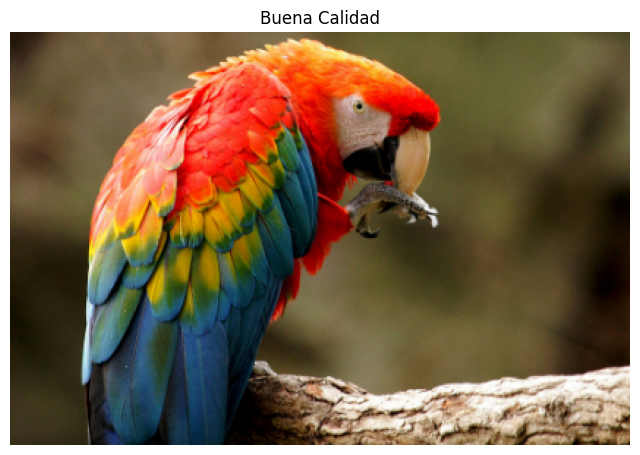

--- Rotada ---
Dimensiones: (282, 423, 3)
Tipo de dato: uint8
Rango de valores: 0 a 255


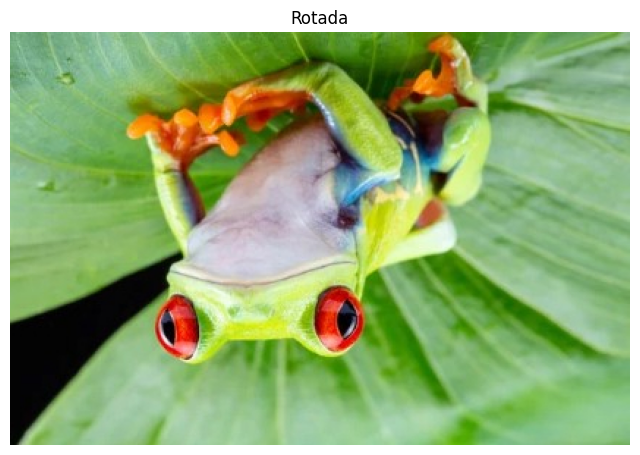

--- Con Problemas ---
Dimensiones: (296, 442, 3)
Tipo de dato: uint8
Rango de valores: 0 a 255


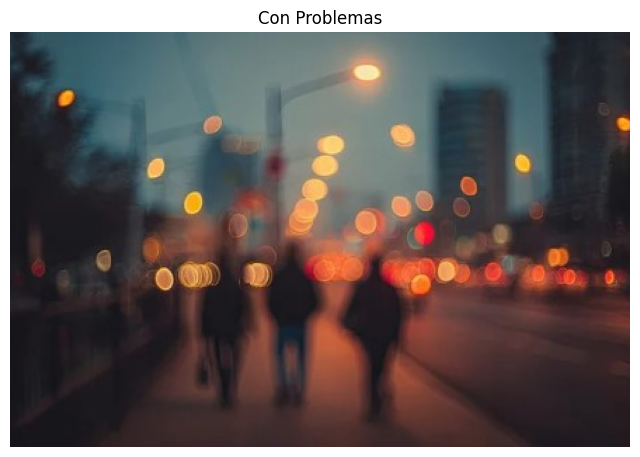

In [7]:
# Define las rutas a tus 3 imágenes
rutas_imagenes = [
    ruta_base + "imagen1.jpg",  # Buena calidad
    ruta_base + "imagen2.jpg",  # Rotada
    ruta_base + "imagen3.jpg"   # Con problemas
]

# Carga las 3 imágenes usando tu función
imagenes = []
nombres = ["Buena Calidad", "Rotada", "Con Problemas"]

for ruta, nombre in zip(rutas_imagenes, nombres):
    img = cargar_imagen(ruta)
    if img is not None:
        imagenes.append(img)
        mostrar_info_imagen(img, titulo=nombre)

## 3.2 Inspección Visual y Análisis

**Material de consulta:** `002/Fundamentos_Imagen_Digital.ipynb`

In [8]:
# Mostra las 3 imágenes lado a lado con sus nombres
# Usa subplots de matplotlib


def crear_grid_imagenes(imagenes, titulos=None, filas=2, figsize=(15, 8)):
    """
    Crea un grid organizado de imágenes para comparación visual.
    Útil para mostrar múltiples imágenes en una sola figura.

    Args:
        imagenes (list): Lista de arrays de imágenes
        titulos (list): Lista de títulos para cada imagen (opcional)
        filas (int): Número de filas en el grid
        figsize (tuple): Tamaño de la figura (ancho, alto)

    Maneja automáticamente:
        - Imágenes en escala de grises (2D arrays)
        - Imágenes en color (3D arrays)
        - Grids irregulares (espacios vacíos)
    """
    n_imagenes = len(imagenes)
    # Calcular columnas necesarias basado en número de imágenes y filas
    columnas = int(np.ceil(n_imagenes / filas))

    # Crear subplot grid
    fig, axes = plt.subplots(filas, columnas, figsize=figsize)

    # Manejar caso especial de una sola imagen
    if n_imagenes == 1:
        axes = [axes]
    elif filas == 1:
        axes = axes.reshape(1, -1)
    elif columnas == 1:
        axes = axes.reshape(-1, 1)

    # Aplanar array de axes para fácil iteración
    axes = axes.flatten()

    # Mostrar cada imagen
    for i, img in enumerate(imagenes):
        # Detectar si es escala de grises o color
        if len(img.shape) == 2:  # Escala de grises
            axes[i].imshow(img, cmap='gray')
        else:  # Color (RGB)
            axes[i].imshow(img)

        # Agregar título si se proporciona
        if titulos and i < len(titulos):
            axes[i].set_title(titulos[i], fontsize=12)

        # Ocultar ejes para mejor visualización
        axes[i].axis('off')

    # Ocultar axes sobrantes en caso de grid irregular
    for i in range(n_imagenes, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()


# Supongamos que ya tienes las imágenes cargadas como arrays
titulos = ["Buena Calidad", "Rotada", "Con Problemas"]

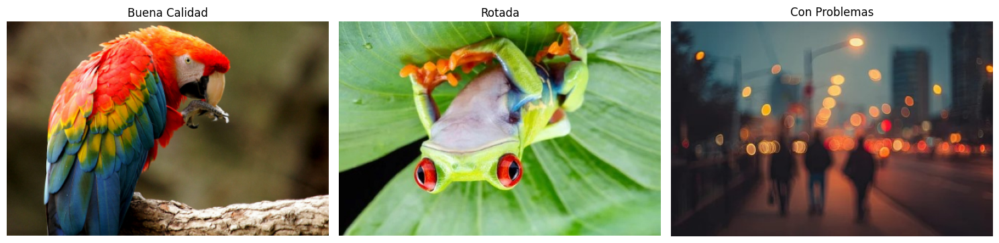

In [9]:
crear_grid_imagenes(imagenes, titulos, filas=1, figsize=(15, 8))

In [10]:
# Para cada imagen, mostrá información básica y un histograma
# Esto te ayuda a entender los problemas de cada una

def extraer_estadisticas_basicas(imagen_canal):
    """
    Extrae estadísticas descriptivas fundamentales de un canal de imagen.
    Estas métricas capturan la distribución de intensidades en la imagen.

    Args:
        imagen_canal (numpy.ndarray): Canal individual de imagen (2D array)

    Returns:
        dict: Diccionario con estadísticas básicas

    Estadísticas calculadas:
        - Media: Intensidad promedio (indica brillo general)
        - Desviación estándar: Variabilidad de intensidades (indica contraste)
        - Mediana: Valor central (robusto a valores atípicos)
        - Cuartiles: Q25 y Q75 (rango intercuartílico)
        - Mínimo/Máximo: Rango completo de valores
    """
    # Aplanar imagen a vector 1D para cálculos estadísticos
    datos = imagen_canal.flatten()

    # Calcular estadísticas descriptivas
    estadisticas = {
        'media': np.mean(datos),              # Promedio aritmético
        'std': np.std(datos),                 # Desviación estándar (medida de dispersión)
        'mediana': np.median(datos),          # Valor del percentil 50
        'q25': np.percentile(datos, 25),      # Primer cuartil
        'q75': np.percentile(datos, 75),      # Tercer cuartil
        'min': np.min(datos),                 # Valor mínimo
        'max': np.max(datos)                  # Valor máximo
    }

    return estadisticas


--- Buena Calidad ---
Dimensiones: (282, 423, 3)
Tipo de dato: uint8
Estadísticas canal R: {'media': np.float64(107.90025652633167), 'std': np.float64(69.64873033282505), 'mediana': np.float64(98.0), 'q25': np.float64(54.0), 'q75': np.float64(130.0), 'min': np.uint8(0), 'max': np.uint8(255)}
Estadísticas canal G: {'media': np.float64(83.83021477792867), 'std': np.float64(49.9143090076976), 'mediana': np.float64(82.0), 'q25': np.float64(49.0), 'q75': np.float64(102.0), 'min': np.uint8(0), 'max': np.uint8(255)}
Estadísticas canal B: {'media': np.float64(55.11949432456449), 'std': np.float64(47.508525336103276), 'mediana': np.float64(47.0), 'q25': np.float64(23.0), 'q75': np.float64(70.0), 'min': np.uint8(0), 'max': np.uint8(254)}


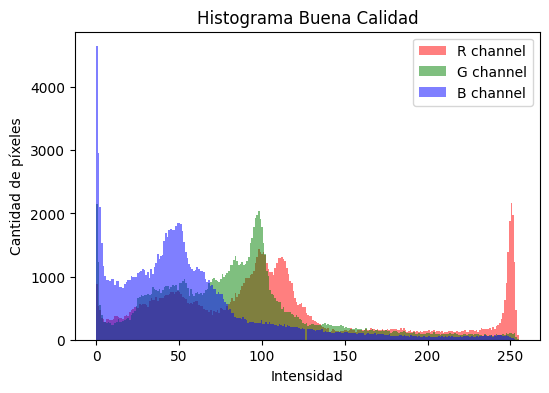

--- Rotada ---
Dimensiones: (282, 423, 3)
Tipo de dato: uint8
Estadísticas canal R: {'media': np.float64(132.92850795566957), 'std': np.float64(51.2269106138535), 'mediana': np.float64(136.0), 'q25': np.float64(111.0), 'q75': np.float64(158.0), 'min': np.uint8(0), 'max': np.uint8(255)}
Estadísticas canal G: {'media': np.float64(164.3176902570293), 'std': np.float64(54.5911788763496), 'mediana': np.float64(181.0), 'q25': np.float64(152.0), 'q75': np.float64(195.0), 'min': np.uint8(0), 'max': np.uint8(255)}
Estadísticas canal B: {'media': np.float64(100.75196586355482), 'std': np.float64(58.45845014157311), 'mediana': np.float64(112.0), 'q25': np.float64(56.0), 'q75': np.float64(142.0), 'min': np.uint8(0), 'max': np.uint8(255)}


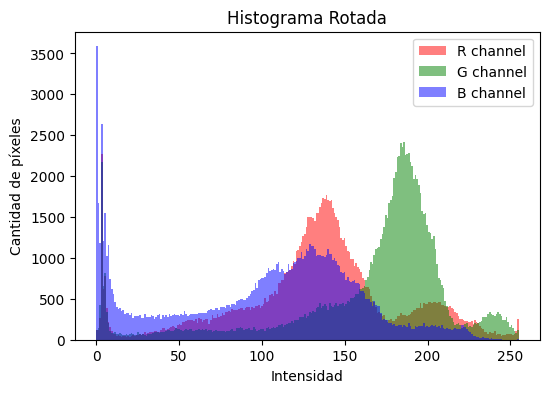

--- Con Problemas ---
Dimensiones: (296, 442, 3)
Tipo de dato: uint8
Estadísticas canal R: {'media': np.float64(79.84288247523541), 'std': np.float64(50.15415885074426), 'mediana': np.float64(66.0), 'q25': np.float64(40.0), 'q75': np.float64(107.0), 'min': np.uint8(16), 'max': np.uint8(255)}
Estadísticas canal G: {'media': np.float64(68.77017090620032), 'std': np.float64(40.657258010546926), 'mediana': np.float64(55.0), 'q25': np.float64(35.0), 'q75': np.float64(101.0), 'min': np.uint8(7), 'max': np.uint8(241)}
Estadísticas canal B: {'media': np.float64(66.77807417145652), 'std': np.float64(35.68240962872938), 'mediana': np.float64(53.0), 'q25': np.float64(38.0), 'q75': np.float64(101.0), 'min': np.uint8(0), 'max': np.uint8(182)}


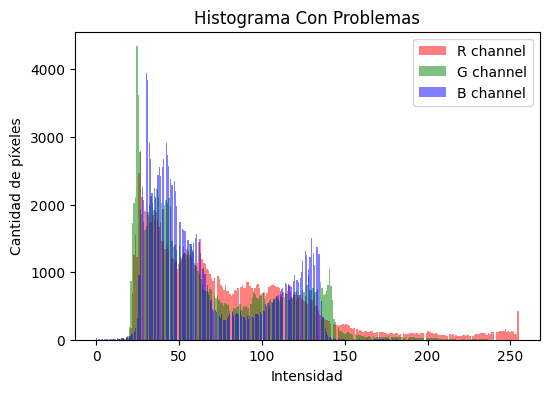

In [11]:
for i, img in enumerate(imagenes):
    print(f"--- {titulos[i]} ---")
    print(f"Dimensiones: {img.shape}")
    print(f"Tipo de dato: {img.dtype}")

    if len(img.shape) == 2:  # Escala de grises
        stats = extraer_estadisticas_basicas(img)
        print("Estadísticas:", stats)

        plt.figure(figsize=(6,4))
        plt.hist(img.ravel(), bins=256, color='gray', alpha=0.7)
        plt.title(f'Histograma {titulos[i]}')
        plt.xlabel('Intensidad')
        plt.ylabel('Cantidad de píxeles')
        plt.show()

    else:  # Color
        colores = ('r', 'g', 'b')
        plt.figure(figsize=(6,4))
        for j, color in enumerate(colores):
            canal = img[:,:,j]
            stats = extraer_estadisticas_basicas(canal)
            print(f"Estadísticas canal {color.upper()}:", stats)

            plt.hist(canal.ravel(), bins=256, color=color, alpha=0.5, label=f'{color.upper()} channel')

        plt.title(f'Histograma {titulos[i]}')
        plt.xlabel('Intensidad')
        plt.ylabel('Cantidad de píxeles')
        plt.legend()
        plt.show()

## 3.3 Identificación de Problemas

Basándote en tu inspección visual, identificá los problemas principales de cada imagen:

**Imagen 1 (Buena Calidad):**
- Problemas identificados:
  * La imagen tiene buena distribución de colores (R, G, B) y contraste aceptable.
  * No se observan problemas de saturación extrema ni subexposición.

- Preprocessing necesario:
  * Normalización de pixeles (si el modelo lo requiere, e.g., dividir por 255).
  * Ningún otro ajuste crítico necesario.

**Imagen 2 (Rotada):**
- Problemas identificados:
  * Imagen correctamente expuesta, pero rotada.
  * Contraste ligeramente más alto que la imagen 1 (medias y desviaciones estándar más elevadas).

- Preprocessing necesario:
  * Rotación/corrección de orientación para alinear correctamente la imagen.
  * Normalización de pixeles.

**Imagen 3 (Con Problemas):**
- Problemas identificados:
  * Imagen más oscura (medias de R, G, B más bajas).
  * Contraste reducido (desviaciones estándar más bajas).
  * Posibles sombras o subexposición parcial.
  * Rango dinámico irregular (valores mínimos y máximos dispersos, especialmente en azul y verde).

- Preprocessing necesario:
  * Ajuste de brillo y contraste (p. ej., ecualización de histograma o stretching lineal).
  * Normalización de pixeles.

---

# PARTE 4: Preprocessing Básico

Ahora vas a aplicar técnicas de preprocessing para mejorar cada imagen. Trabajá con una imagen por vez.

## 4.1 Segmentación Básica

Separar el documento del fondo es el primer paso crítico.

**Material de consulta:** `Segmentacion.ipynb` (especialmente las funciones de umbralización)

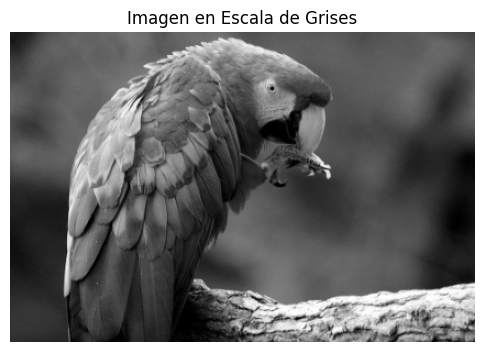

In [12]:
# Elegí UNA de tus imágenes para trabajar primero
imagen_trabajo_0 = imagenes[0]  # Cambiá el índice según necesites

# Convertir a escala de grises
# Si la imagen está en RGB (matplotlib), OpenCV espera BGR, pero podemos usar cvtColor igual
imagen_gray_0 = cv2.cvtColor(imagen_trabajo_0, cv2.COLOR_RGB2GRAY)

# Mostrar la imagen en escala de grises
plt.figure(figsize=(6,6))
plt.imshow(imagen_gray_0, cmap='gray')
plt.title('Imagen en Escala de Grises')
plt.axis('off')
plt.show()

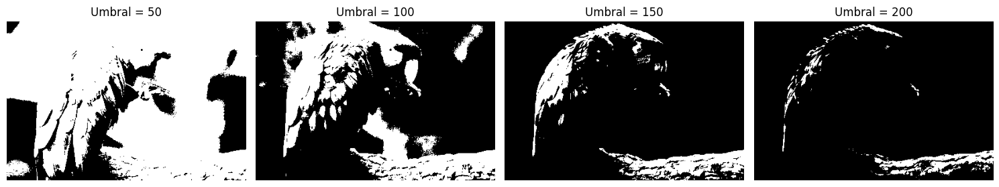

In [13]:
# Aplicá segmentación por umbralización
# Probá diferentes valores hasta encontrar el mejor

# Lista de umbrales a probar
umbrales = [50, 100, 150, 200]  # Ajustá según tus imágenes

plt.figure(figsize=(15,4))
for i, t in enumerate(umbrales):
    # Aplicar umbral
    _, imagen_bin_0 = cv2.threshold(imagen_gray_0, t, 255, cv2.THRESH_BINARY)

    # Mostrar resultado
    plt.subplot(1, len(umbrales), i+1)
    plt.imshow(imagen_bin_0, cmap='gray')
    plt.title(f"Umbral = {t}")
    plt.axis('off')

plt.tight_layout()
plt.show()

Observación: El valor óptimo parece encontrarse entre 101 y 149.

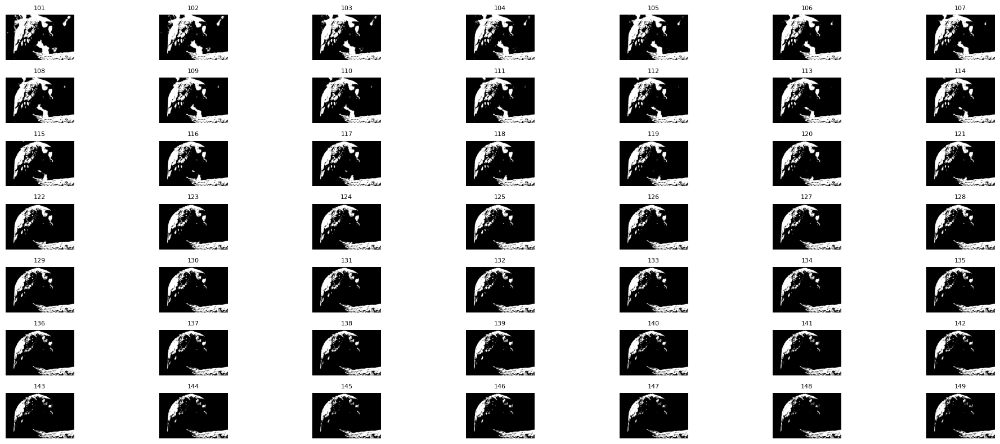

In [14]:
# Probar umbrales entre 101 y 149
plt.figure(figsize=(20, 8))

for i, t in enumerate(range(101, 150)):
    # Aplicar umbral
    _, imagen_bin_0 = cv2.threshold(imagen_gray_0, t, 255, cv2.THRESH_BINARY)

    # Mostrar cada resultado en un subplot
    plt.subplot(7, 7, i+1)  # 7x7 = 49 imágenes, suficiente para 101-149
    plt.imshow(imagen_bin_0, cmap='gray')
    plt.title(f"{t}", fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [15]:
mostrar_umbral_interactivo(imagen_gray_0)

interactive(children=(IntSlider(value=121, description='t', max=255), Output()), _dom_classes=('widget-interac…

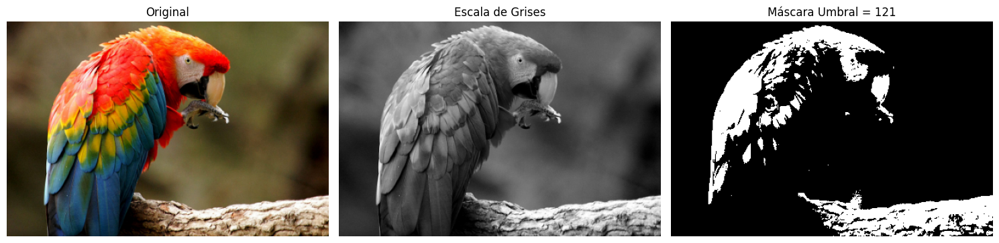

In [16]:
# Mostrá el resultado: original, escala de grises, y máscara

# Aplicar umbral fijo = 121
umbral = 121
_, imagen_bin_0 = cv2.threshold(imagen_gray_0, umbral, 255, cv2.THRESH_BINARY)

# Mostrar resultados lado a lado
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(imagenes[0])
plt.title("Original")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(imagen_gray_0, cmap='gray')
plt.title("Escala de Grises")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(imagen_bin_0, cmap='gray')
plt.title(f"Máscara Umbral = {umbral}")
plt.axis('off')

plt.tight_layout()
plt.show()


## 4.2 Mejora de Calidad

**Material de consulta:** `Mejora_Imagen_Ecualizacion.ipynb`

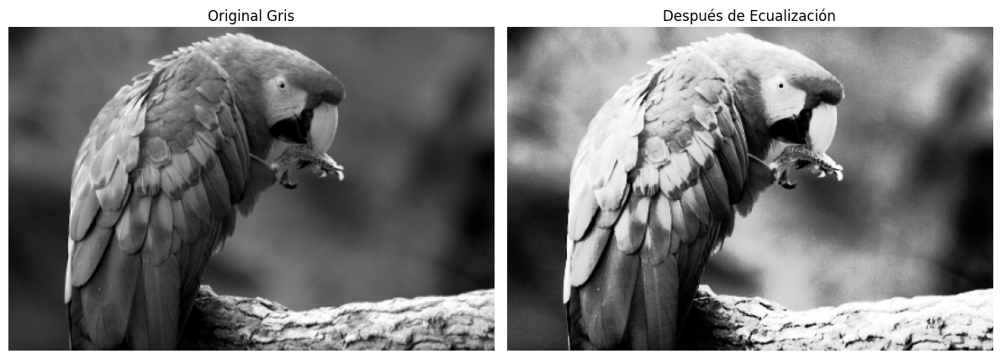

In [17]:
# Si tu imagen tiene problemas de contraste, aplicá ecualización

# Aplicar ecualización de histograma
imagen_ecualizada_0 = cv2.equalizeHist(imagen_gray_0)

# Mostrar resultados
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.imshow(imagen_gray_0, cmap='gray')
plt.title("Original Gris")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(imagen_ecualizada_0, cmap='gray')
plt.title("Después de Ecualización")
plt.axis('off')

plt.tight_layout()
plt.show()

Según los resultados estadísticos para la Imagen 1 (Buena Calidad):

* Medias de R/G/B: 107, 83, 55 → valores medios, sin extremos.

* Desviaciones estándar: 69, 49, 47 → contraste decente.

* Min/Max abarcan casi todo el rango (0–255).

Conclusión: no es necesario aplicar ecualización para esta imagen. La comparación entre la imagen original y la imagen después de aplicar ecualización, observa que la ecualización provoca que las zonas claras se vean sobreexpuestas.

## 4.3 Comparación de Resultados

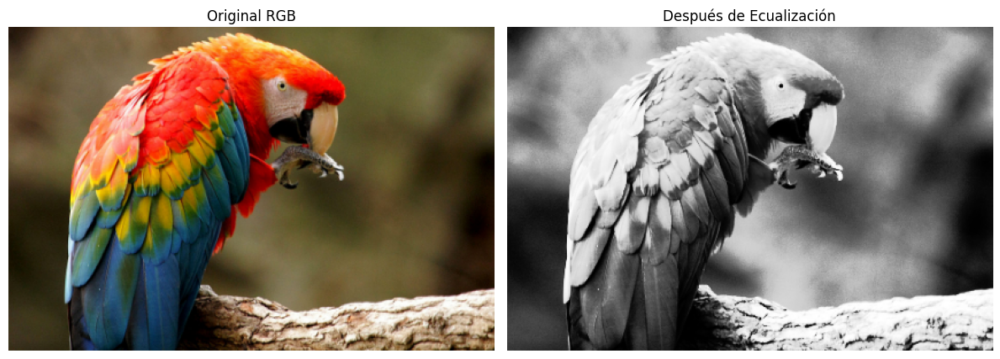

In [18]:
# Mostrá lado a lado: imagen original vs imagen procesada

# Mostrar resultados
plt.figure(figsize=(12,5))

# Imagen original a color
plt.subplot(1,2,1)
plt.imshow(imagen_trabajo_0)
plt.title("Original RGB")
plt.axis('off')

# Imagen normalizada a color
plt.subplot(1,2,2)
plt.imshow(imagen_ecualizada_0)
plt.title("Después de Ecualización")
plt.axis('off')

plt.tight_layout()
plt.show()


In [19]:
estadisticas = extraer_estadisticas_basicas(imagen_ecualizada_0)

print("--- Estadísticas de la Imagen Ecualizada (Gris) ---")
for k, v in estadisticas.items():
    print(f"{k}: {v}")

--- Estadísticas de la Imagen Ecualizada (Gris) ---
media: 127.889408648123
std: 73.84541947580217
mediana: 128.0
q25: 65.0
q75: 192.0
min: 0
max: 255


In [20]:
imagen_mejorada_0 = apply_clahe(imagen_ecualizada_0)

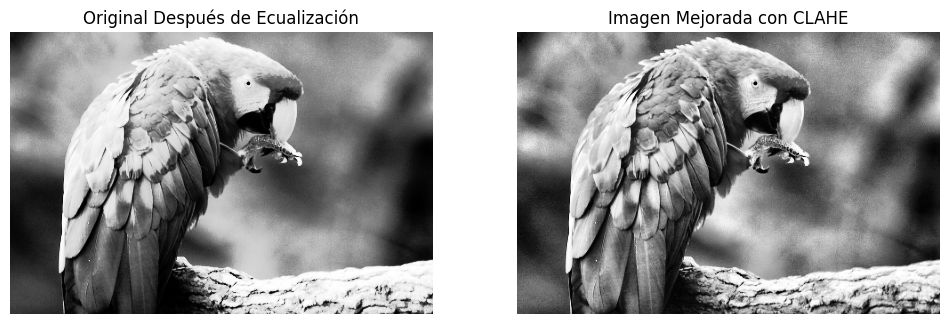

In [21]:
# Mostrar resultado
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(imagen_ecualizada_0, cmap='gray')
axes[0].set_title("Original Después de Ecualización")
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(imagen_mejorada_0, cv2.COLOR_BGR2RGB))
axes[1].set_title("Imagen Mejorada con CLAHE")
axes[1].axis('off')

plt.show()

In [22]:
estadisticas = extraer_estadisticas_basicas(imagen_mejorada_0)

print("--- Estadísticas de la Imagen Mejorada (Gris) ---")
for k, v in estadisticas.items():
    print(f"{k}: {v}")

--- Estadísticas de la Imagen Mejorada (Gris) ---
media: 127.87465698684953
std: 64.8604234745975
mediana: 131.0
q25: 75.0
q75: 177.0
min: 0
max: 255


Comparación:

* Media: prácticamente igual (~127.9 → 127.8) → el brillo global no cambia.

* Desviación estándar: baja bastante (73.8 → 64.8) → se reducen los extremos, el contraste queda más balanceado.

* Mediana: sube (128 → 131) → la imagen tiende a aclararse un poco.

* Q25: sube de 65 → 75 → las sombras se levantan (menos oscuridad total).

* Q75: baja de 192 → 177 → las altas luces se controlan, evitando saturación.

* Mínimo/Máximo: se mantienen en 0 y 255 → todavía se conserva el rango dinámico completo.

En conclusión:

* La ecualización global da más contraste, pero puede quemar zonas.

* La aplicación de CLAHE hace que los valores se concentren en una zona más equilibrada, levantando detalles en sombras y protegiendo las luces.

## 4.4 Aplicación a las Otras Imágenes

Repetí el proceso para tus otras 2 imágenes, adaptando las técnicas según los problemas específicos de cada una:

## Imagen 2

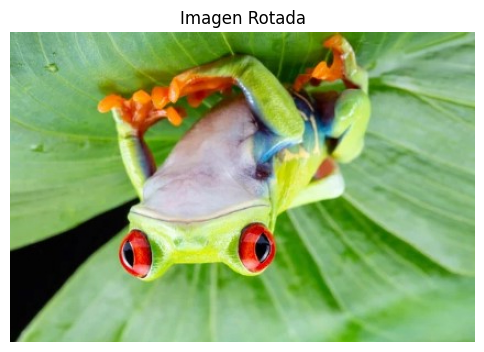

In [23]:
# Procesamiento de la segunda imagen
imagen_trabajo_1 = imagenes[1]  # Cambiá el índice según necesites

# Mostrar resultado
plt.figure(figsize=(6,6))
plt.imshow(imagen_trabajo_1, cmap='gray')
plt.title("Imagen Rotada")
plt.axis('off')
plt.show()

In [24]:
imagen_rotada = cv2.rotate(imagen_trabajo_1, cv2.ROTATE_180)

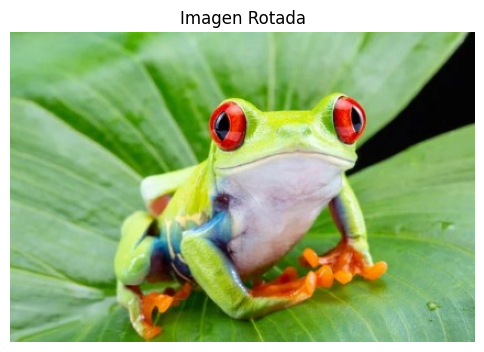

In [25]:
# Mostrar resultado
plt.figure(figsize=(6,6))
plt.imshow(imagen_rotada, cmap='gray')
plt.title("Imagen Rotada")
plt.axis('off')
plt.show()

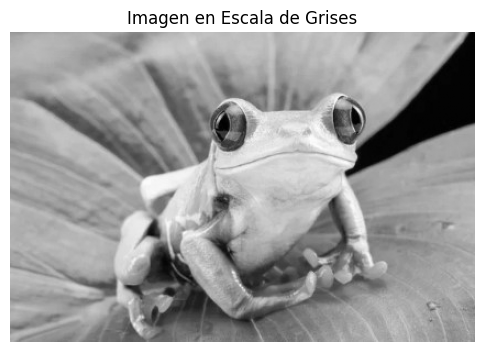

In [26]:
# Convertir a escala de grises
# Si la imagen está en RGB (matplotlib), OpenCV espera BGR, pero podemos usar cvtColor igual
imagen_gray_1 = cv2.cvtColor(imagen_rotada, cv2.COLOR_RGB2GRAY)

# Mostrar la imagen en escala de grises
plt.figure(figsize=(6,6))
plt.imshow(imagen_gray_1, cmap='gray')
plt.title('Imagen en Escala de Grises')
plt.axis('off')
plt.show()

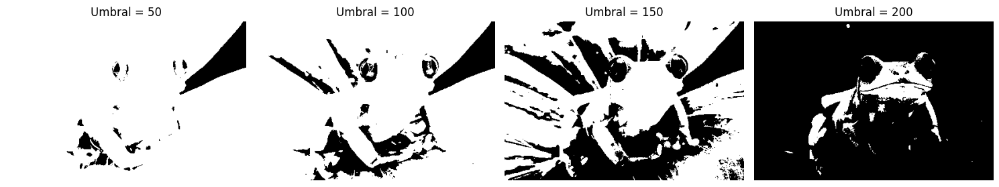

In [27]:
# Aplicá segmentación por umbralización
# Probá diferentes valores hasta encontrar el mejor

# Lista de umbrales a probar
umbrales = [50, 100, 150, 200]  # Ajustá según tus imágenes

plt.figure(figsize=(15,4))
for i, t in enumerate(umbrales):
    # Aplicar umbral
    _, imagen_bin_1 = cv2.threshold(imagen_gray_1, t, 255, cv2.THRESH_BINARY)

    # Mostrar resultado
    plt.subplot(1, len(umbrales), i+1)
    plt.imshow(imagen_bin_1, cmap='gray')
    plt.title(f"Umbral = {t}")
    plt.axis('off')

plt.tight_layout()
plt.show()

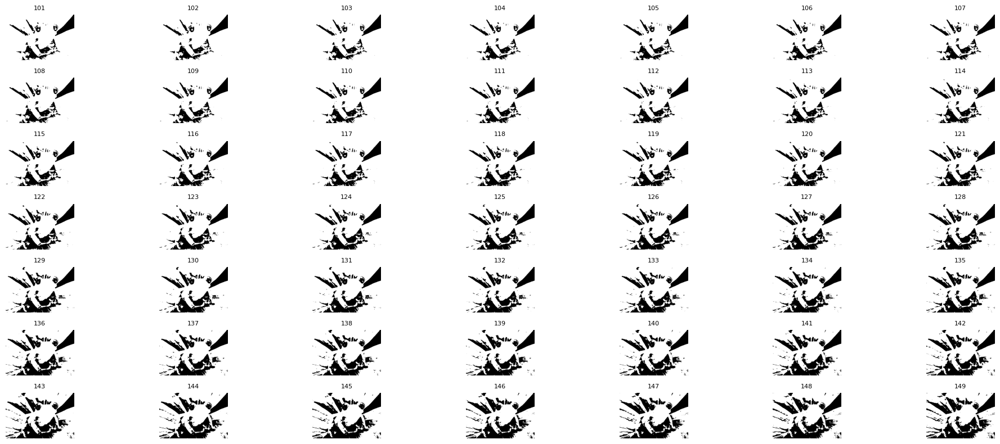

In [28]:
# Probar umbrales entre 101 y 149
plt.figure(figsize=(20, 8))

for i, t in enumerate(range(101, 150)):
    # Aplicar umbral
    _, imagen_bin_1 = cv2.threshold(imagen_gray_1, t, 255, cv2.THRESH_BINARY)

    # Mostrar cada resultado en un subplot
    plt.subplot(7, 7, i+1)  # 7x7 = 49 imágenes, suficiente para 151-199
    plt.imshow(imagen_bin_1, cmap='gray')
    plt.title(f"{t}", fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()

La imagen2 tiene tonos verdosos/bronceados claros, siendo el canal G es más brillante.

Para segmentar usando grises (promedio o conversión), el umbral efectivo probablemente estará alrededor de 120–140, porque:

* Se sitúa por debajo de los valores predominantes del documento (para que quede blanco).

* Se sitúa por encima de los valores oscuros del fondo (para que quede negro).

In [29]:
mostrar_umbral_interactivo(imagen_gray_1)

interactive(children=(IntSlider(value=121, description='t', max=255), Output()), _dom_classes=('widget-interac…

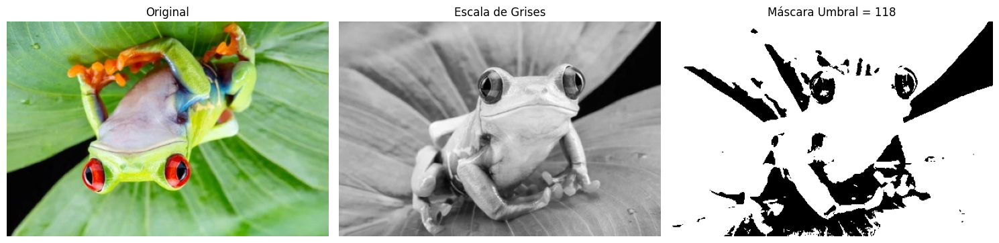

In [30]:
# Mostrá el resultado: original, escala de grises, y máscara

# Aplicar umbral fijo = 118
umbral = 118
_, imagen_bin_1 = cv2.threshold(imagen_gray_1, umbral, 255, cv2.THRESH_BINARY)

# Mostrar resultados lado a lado
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(imagenes[1])
plt.title("Original")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(imagen_gray_1, cmap='gray')
plt.title("Escala de Grises")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(imagen_bin_1, cmap='gray')
plt.title(f"Máscara Umbral = {umbral}")
plt.axis('off')

plt.tight_layout()
plt.show()


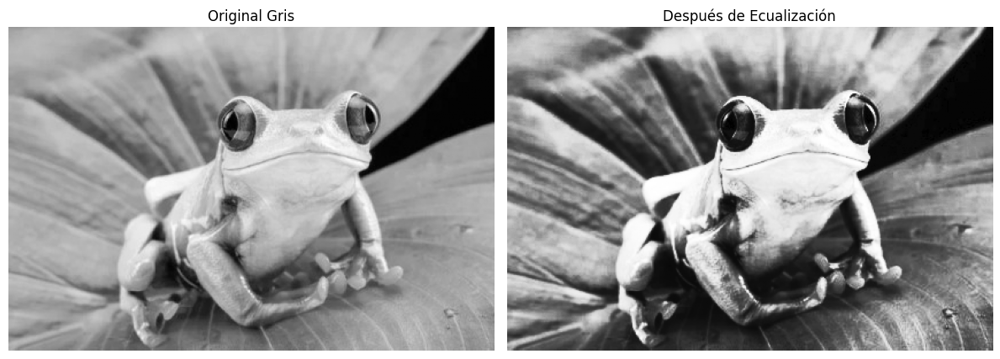

In [31]:
# Si tu imagen tiene problemas de contraste, aplicá ecualización

# Aplicar ecualización de histograma
imagen_ecualizada_1 = cv2.equalizeHist(imagen_gray_1)

# Mostrar resultados
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.imshow(imagen_gray_1, cmap='gray')
plt.title("Original Gris")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(imagen_ecualizada_1, cmap='gray')
plt.title("Después de Ecualización")
plt.axis('off')

plt.tight_layout()
plt.show()

In [32]:
estadisticas = extraer_estadisticas_basicas(imagen_ecualizada_1)

print("--- Estadísticas de la Imagen Ecualizada (Gris) ---")
for k, v in estadisticas.items():
    print(f"{k}: {v}")

--- Estadísticas de la Imagen Ecualizada (Gris) ---
media: 128.65355532082557
std: 73.8061712289916
mediana: 130.0
q25: 64.0
q75: 192.0
min: 0
max: 255


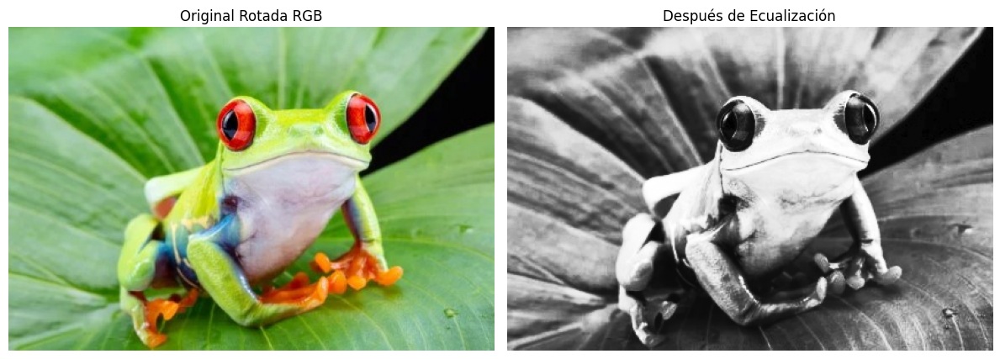

In [33]:
# Mostrá lado a lado: imagen original vs imagen procesada

# Mostrar resultados
plt.figure(figsize=(12,5))

# Imagen original a color
plt.subplot(1,2,1)
plt.imshow(imagen_rotada)
plt.title("Original Rotada RGB")
plt.axis('off')

# Imagen normalizada a color
plt.subplot(1,2,2)
plt.imshow(imagen_ecualizada_1)
plt.title("Después de Ecualización")
plt.axis('off')

plt.tight_layout()
plt.show()

Observaciones:

* La ecualización redistribuyó las intensidades para usar todo el rango [0,255].

* El contraste aumentó, porque la std es relativamente alta y los cuartiles se separaron más.

* Algunas zonas se pueden ver más claras o “quemadas” (min/max extremos), pero la información general del documento es más visible.

In [34]:
imagen_mejorada_1 = apply_clahe(imagen_ecualizada_1)

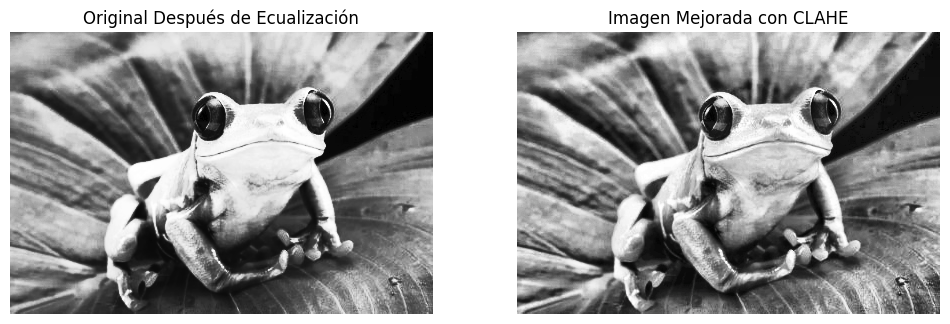

In [35]:
# Mostrar resultado
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(imagen_ecualizada_1, cmap='gray')
axes[0].set_title("Original Después de Ecualización")
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(imagen_mejorada_1, cv2.COLOR_BGR2RGB))
axes[1].set_title("Imagen Mejorada con CLAHE")
axes[1].axis('off')

plt.show()

In [36]:
estadisticas = extraer_estadisticas_basicas(imagen_mejorada_1)

print("--- Estadísticas de la Imagen Mejorada (Gris) ---")
for k, v in estadisticas.items():
    print(f"{k}: {v}")

--- Estadísticas de la Imagen Mejorada (Gris) ---
media: 132.3871060588278
std: 68.60548866509184
mediana: 137.0
q25: 77.0
q75: 190.0
min: 2
max: 255


Comparación:

* Media: sube levemente (128 → 132), la imagen con CLAHE queda un poco más clara en promedio.

* Desviación estándar: baja (73.8 → 68.6), lo que indica que el contraste es más equilibrado y no tan extremo como en la ecualización global.

* Mediana: sube (130 → 137), confirmando que se empuja la imagen hacia tonos un poco más claros.

* Cuartiles:

  * Q25 pasa de 64 → 77 → las sombras dejan de ser tan oscuras.

  * Q75 se mantiene en ~190 → las zonas claras no se saturan tanto.

* Mínimo: no arranca en 0 sino en 2, muestra que CLAHE evita “aplastar” las sombras.

Conclusión:

* La ecualización global expande todo el rango de intensidades, lo que genera imágenes más “duras” o con partes quemadas.

* La aplicación de CLAHE redistribuye mejor los contrastes locales, mejora la legibilidad del documento y mantiene un rango dinámico más saludable.

## Imagen 3

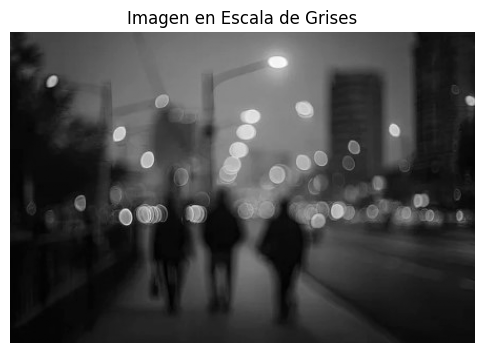

In [37]:
# Procesamiento de la tercera imagen
imagen_trabajo_2 = imagenes[2]  # Cambiá el índice según necesites

# Convertir a escala de grises
# Si la imagen está en RGB (matplotlib), OpenCV espera BGR, pero podemos usar cvtColor igual
imagen_gray_2 = cv2.cvtColor(imagen_trabajo_2, cv2.COLOR_RGB2GRAY)

# Mostrar la imagen en escala de grises
plt.figure(figsize=(6,6))
plt.imshow(imagen_gray_2, cmap='gray')
plt.title('Imagen en Escala de Grises')
plt.axis('off')
plt.show()


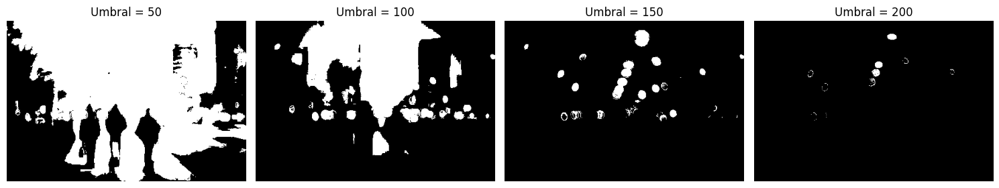

In [38]:
# Aplicá segmentación por umbralización
# Probá diferentes valores hasta encontrar el mejor

# Lista de umbrales a probar
umbrales = [50, 100, 150, 200]  # Ajustá según tus imágenes

plt.figure(figsize=(15,4))
for i, t in enumerate(umbrales):
    # Aplicar umbral
    _, imagen_bin_2 = cv2.threshold(imagen_gray_2, t, 255, cv2.THRESH_BINARY)

    # Mostrar resultado
    plt.subplot(1, len(umbrales), i+1)
    plt.imshow(imagen_bin_2, cmap='gray')
    plt.title(f"Umbral = {t}")
    plt.axis('off')

plt.tight_layout()
plt.show()

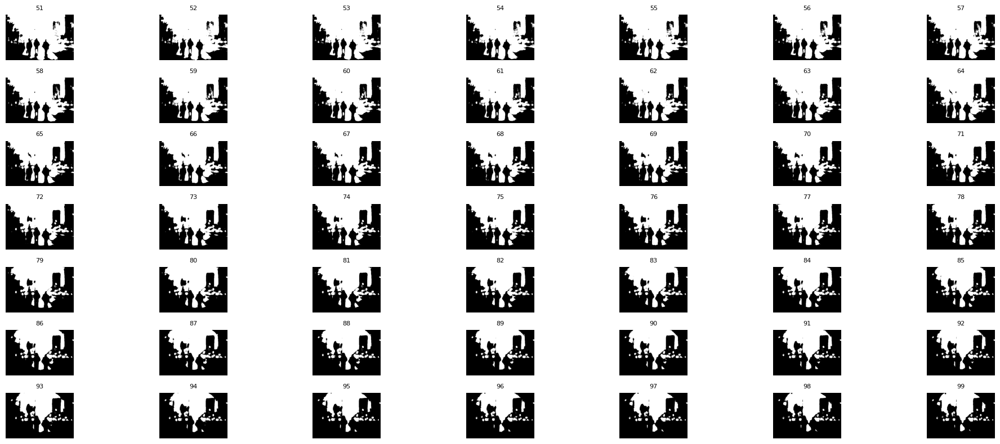

In [39]:
# Probar umbrales entre 51 y 99
plt.figure(figsize=(20, 8))

for i, t in enumerate(range(51, 100)):
    # Aplicar umbral
    _, imagen_bin_2 = cv2.threshold(imagen_gray_2, t, 255, cv2.THRESH_BINARY)

    # Mostrar cada resultado en un subplot
    plt.subplot(7, 7, i+1)  # 7x7 = 49 imágenes, suficiente para 151-199
    plt.imshow(imagen_bin_2, cmap='gray')
    plt.title(f"{t}", fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [40]:
mostrar_umbral_interactivo(imagen_gray_2)

interactive(children=(IntSlider(value=121, description='t', max=255), Output()), _dom_classes=('widget-interac…

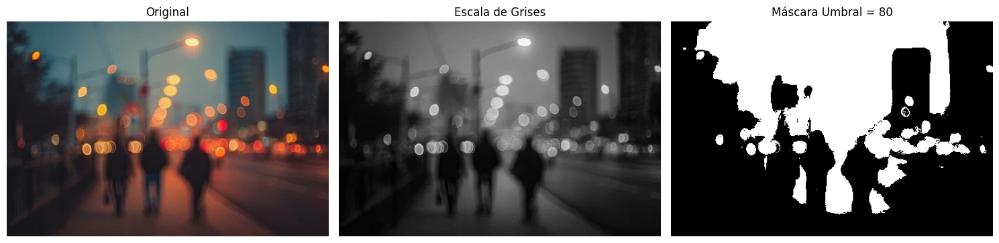

In [41]:
# Mostrá el resultado: original, escala de grises, y máscara

# Aplicar umbral fijo = 80
umbral = 80
_, imagen_bin_2 = cv2.threshold(imagen_gray_2, umbral, 255, cv2.THRESH_BINARY)

# Mostrar resultados lado a lado
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(imagenes[2])
plt.title("Original")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(imagen_gray_2, cmap='gray')
plt.title("Escala de Grises")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(imagen_bin_2, cmap='gray')
plt.title(f"Máscara Umbral = {umbral}")
plt.axis('off')

plt.tight_layout()
plt.show()

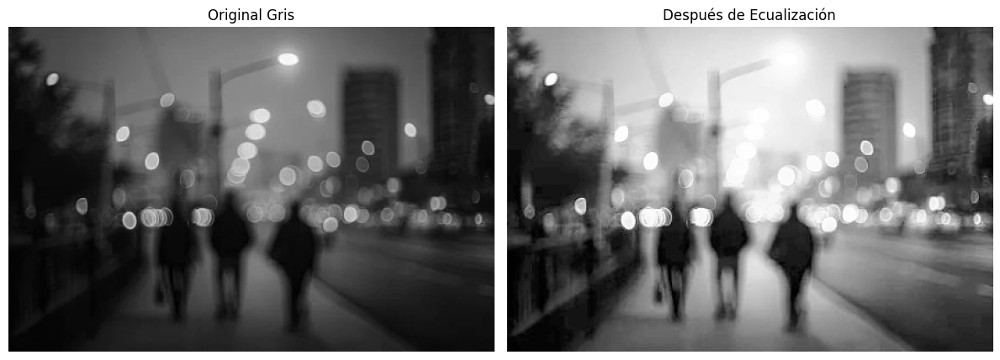

In [42]:
# Si tu imagen tiene problemas de contraste, aplicá ecualización

# Aplicar ecualización de histograma
imagen_ecualizada_2 = cv2.equalizeHist(imagen_gray_2)

# Mostrar resultados
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.imshow(imagen_gray_2, cmap='gray')
plt.title("Original Gris")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(imagen_ecualizada_2, cmap='gray')
plt.title("Después de Ecualización")
plt.axis('off')

plt.tight_layout()
plt.show()

In [43]:
estadisticas = extraer_estadisticas_basicas(imagen_ecualizada_2)

print("--- Estadísticas de la Imagen Ecualizada (Gris) ---")
for k, v in estadisticas.items():
    print(f"{k}: {v}")

--- Estadísticas de la Imagen Ecualizada (Gris) ---
media: 128.75123058578941
std: 72.9674505551076
mediana: 128.0
q25: 65.0
q75: 192.0
min: 0
max: 255


Observación: la ecualización mejoró el contraste y distribuyó los niveles de gris de forma más homogénea.

In [44]:
imagen_mejorada_2 = apply_clahe(imagen_ecualizada_2)

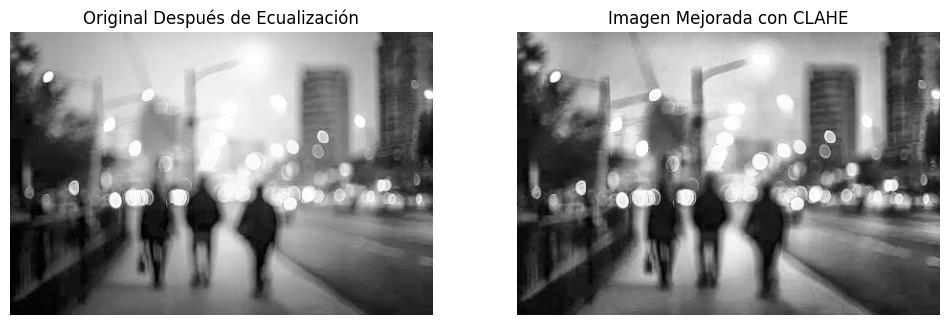

In [45]:
# Mostrar resultado
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(imagen_ecualizada_2, cmap='gray')
axes[0].set_title("Original Después de Ecualización")
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(imagen_mejorada_2, cv2.COLOR_BGR2RGB))
axes[1].set_title("Imagen Mejorada con CLAHE")
axes[1].axis('off')

plt.show()

In [46]:
estadisticas = extraer_estadisticas_basicas(imagen_mejorada_2)

print("--- Estadísticas de la Imagen Mejorada (Gris) ---")
for k, v in estadisticas.items():
    print(f"{k}: {v}")

--- Estadísticas de la Imagen Mejorada (Gris) ---
media: 120.66842974195916
std: 67.66947980456665
mediana: 115.0
q25: 62.0
q75: 178.0
min: 0
max: 255


Comparación:

* Media: baja (128.7 → 120.6) → la imagen globalmente se oscurece un poco, lo cual puede ayudar si estaba demasiado lavada.

* Desviación estándar: también baja (72.9 → 67.6) → se reduce un poco la dispersión, lo que suele significar menos ruido en zonas homogéneas.

* Mediana: cae (128 → 115) → la tendencia va hacia tonos más oscuros.

* Q25 y Q75: bajan (65→62 y 192→178) → el rango intermedio se compacta, lo que suele mejorar legibilidad al acentuar bordes y detalles del documento.

* Min/Max: siguen en 0 y 255 → no se pierde rango dinámico.

Conclusión:

* La ecualización global igualó el histograma pero quizá se veía demasiado “plana”.

* La aplicación de CLAHE en esta imagen refuerza el contraste local y oscurece un poco los fondos, mejorando la definición en las contornos.

## 4.5 Resultados Finales

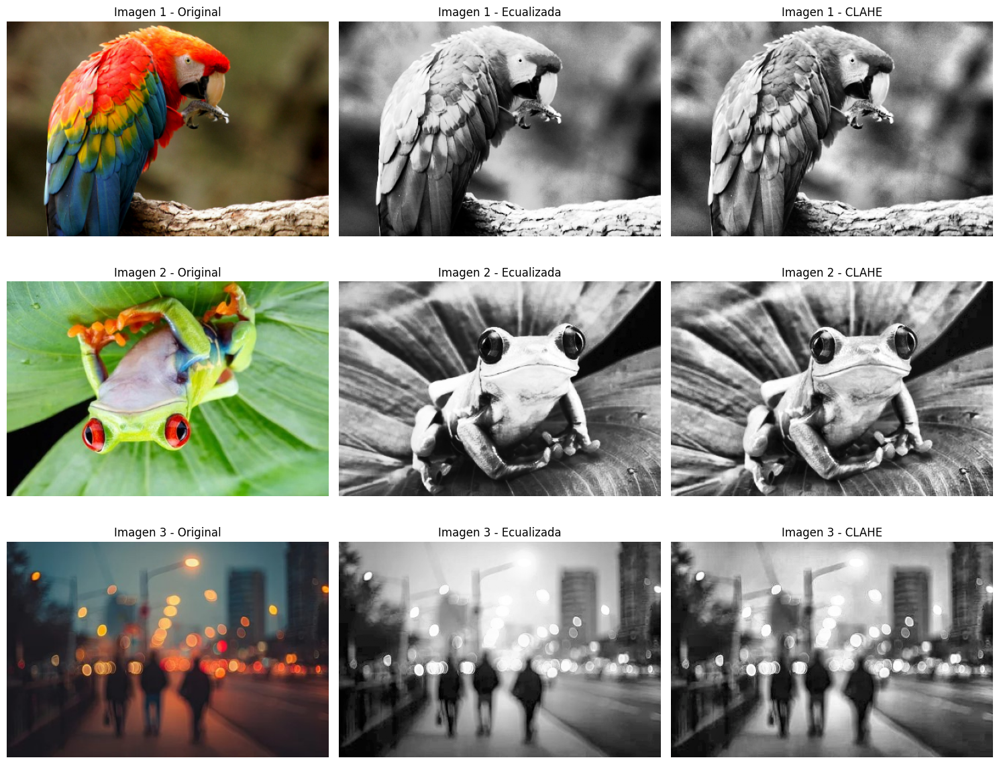

In [47]:
# Suponiendo que ya tenés guardadas:
imagenes_gray_eq = [imagen_ecualizada_0, imagen_ecualizada_1, imagen_ecualizada_2]   # versiones ecualizadas
imagenes_gray_clahe = [imagen_mejorada_0, imagen_mejorada_1, imagen_mejorada_2] # versiones CLAHE
imagenes_rgb = [imagen_trabajo_0, imagen_trabajo_1, imagen_trabajo_2]   # originales a color

# Juntamos todas en orden: Original - Ecualizada - CLAHE
imagenes_comparacion = []
titulos_comparacion = []

for i in range(3):
    imagenes_comparacion.extend([
        imagenes_rgb[i],
        imagenes_gray_eq[i],
        imagenes_gray_clahe[i]
    ])
    titulos_comparacion.extend([
        f"Imagen {i+1} - Original",
        f"Imagen {i+1} - Ecualizada",
        f"Imagen {i+1} - CLAHE"
    ])

# Mostrar grid con 3 filas (una por imagen) y 3 columnas (Original / Ecualizada / CLAHE)
crear_grid_imagenes(
    imagenes=imagenes_comparacion,
    titulos=titulos_comparacion,
    filas=3,
    figsize=(15, 12)
)

---

# REFLEXIÓN FINAL

## Análisis de Resultados

**¿Qué técnica fue más efectiva para cada tipo de problema?**

* Imagen 1 (Buena calidad):

  * La imagen no requería un gran preprocesamiento, ya que presentaba un buen contraste.

  * La ecualización global no aportó mejoras significativas e incluso generó una imagen “quemada”.

  * La técnica más efectiva fue mantener la imagen original o aplicar un CLAHE suave, que permitió resaltar detalles sin perder la naturalidad.

* Imagen 2 (Rotada):

  * El principal problema era la orientación. La rotación solucionó completamente este inconveniente.

  * En cuanto al contraste, la ecualización global funcionó, pero CLAHE ofreció un mejor balance local, recuperando detalles sin saturar el fondo.

* Imagen 3 (Con problemas de iluminación y ruido):

  * Fue la más desafiante: presentaba bajo contraste y variaciones de iluminación.

  * La ecualización global mejoró parcialmente, pero el resultado seguía algo plano.

  * El CLAHE fue la técnica más efectiva, ya que resaltó los bordes del texto y dio más definición, mejorando la legibilidad.

**¿Qué desafíos encontraste durante el procesamiento?**

* Selección del umbral óptimo: no siempre es evidente cuál elegir; se necesitó explorar valores y analizar histogramas.

* Manejo de imágenes con diferentes dimensiones y distribuciones de color, lo que obligó a probar varios enfoques.

* Evitar la sobre-mejora (cuando la imagen ecualizada se veía más artificial que útil).

**¿En qué casos los resultados no fueron óptimos y por qué?**

A pesar de aplicar técnicas de corrección de iluminación como CLAHE, el resultado de la tercera imagen no fue óptimo en términos de nitidez. Si bien se logró mejorar el contraste y la legibilidad en las áreas oscuras, el desenfoque intrínseco de la imagen original persistió.

Esto se debe a que el desenfoque es una pérdida de información a nivel de píxeles que es muy difícil de revertir por completo con las técnicas tradicionales. Los filtros de agudización no crean información nueva, sino que acentúan los cambios de intensidad existentes en los bordes. Si el desenfoque es severo, simplemente no hay suficiente información para recuperar.

No obstante, la estrategia de aplicar CLAHE fue la correcta para el problema de iluminación, y fue la técnica que permitió obtener el mejor resultado posible. Se logró acentuar los elementos del documento que estaban ocultos en las sombras, mejorando su legibilidad y demostrando la efectividad de la cadena de procesamiento.

En conclusión, la calidad del resultado final está intrínsecamente ligada a la calidad de la imagen de entrada. A veces, la meta no es la perfección, sino la mejora sustancial y la preparación del documento para un análisis posterior, como el reconocimiento óptico de caracteres (OCR), que ahora será mucho más probable que funcione.

## Aprendizaje Adquirido

**¿Qué conceptos del curso fueron más útiles?**

Los conceptos más útiles fueron:

* Umbralización: La base para la segmentación del texto en un documento.

* Preprocesamiento: La idea de que una imagen cruda rara vez está lista para ser analizada. La corrección de iluminación y el enderezamiento son pasos previos indispensables.

* Espacios de Color: La necesidad de convertir entre espacios de color como BGR, RGB y LAB para aplicar ciertas técnicas (como CLAHE) o simplemente para visualizar correctamente las imágenes.

**¿Cómo podrías mejorar este sistema en futuras versiones?**

Se podría mejorar el sistema de varias maneras:

* Automatización de Parámetros: En lugar de probar umbrales manualmente, se podría implementar un algoritmo de umbralización automática como Otsu o Umbralización Adaptativa de OpenCV, que calculan el umbral óptimo para diferentes regiones de la imagen.

* Mejor Detección de Contornos: Para el enderezamiento de documentos, se podría implementar una técnica más robusta para la detección de contornos, como la detección de líneas de Hough, que es más precisa para formas rectangulares.

---

## Entregables

1. Este notebook completamente ejecutado con resultados
2. Carpeta `dataset/` con tus 3 imágenes
3. Las reflexiones completadas

**Fecha de entrega:** 24 de Septiembre, 23:59

---